<img width="800px" src="./images/bordeaux.jpg"></img>

# <!-- TITLE --> Régression pour estimer le prix d'une maison à Bordeaux
  <!-- AUTHOR : Anthony DAVID -->

## Objectifs :
 - Prédire les **prix de l'immobilier** à partir d'un ensemble de caractéristiques des maisons. 
 - Comprendre le principe et l'architecture d'une régression avec un réseau neuronal dense et un modèle de forêts aléatoires.

Les données sont obtenues depuis le site du gouvernement suivant : https://www.data.gouv.fr/fr/datasets/demandes-de-valeurs-foncieres/


Outre le prix, l'ensemble des données fournit également de nombreuses autres informations qui sont détaillées dans la notice descriptive. 

## Ce que nous allons faire :

 - Récupérer et nettoyer les données
 - Explorer et visualiser les données
 - Préparer les données pour nos modèles de machine learning
 - Construire un modèle 'DNN' avec Keras
   - Entraînement et sauvegarde du modèle
   - Restaurer le modèle sauvegardé
   - Évaluer le modèle
   - Faire des prédictions
 - Construire un modèle 'DNN' avec PyTorch
   - Entraînement du modèle
   - Évaluer le modèle
   - Faire des prédictions
 - Construire un modèle 'Random Forest' avec sklearn
   - Entraînement du modèle
   - Évaluer le modèle
   - Faire des prédictions


## Imports & Settings

In [1]:
import os

import tensorflow as tf
from tensorflow import keras

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings

pd.set_option('display.max_columns', None)
sns.set(style='dark')

## Removing some warnings appearing when making plots with seaborn.
## The next release on pypi should fix that.
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")

In [2]:
### Fonction utilisée pour tracer l'historique de nos modèles

def plot_history(history, figsize=(8,6), 
                 plot={"Accuracy":['accuracy','val_accuracy'], 'Loss':['loss', 'val_loss']},
                 save_as='auto'):
    """
    Show history
    args:
        history: history
        figsize: fig size
        plot: list of data to plot : {<title>:[<metrics>,...], ...}
    """
    fig_id=0
    for title,curves in plot.items():
        plt.figure(figsize=figsize)
        plt.title(title)
        plt.ylabel(title)
        plt.xlabel('Epoch')
        for c in curves:
            plt.plot(history.history[c])
        plt.legend(curves, loc='upper left')
        if save_as=='auto':
            figname='auto'
        else:
            figname=f'{save_as}_{fig_id}'
            fig_id+=1
        plt.savefig(figname+'.png')
        plt.show()


In [3]:
### Classe utilisée pour sauvegarder l'historique d'entrainement du modèle PyTorch

class convergence_history_MSELoss:
  def __init__(self):
    """
    Class to save the training converge properties
    """
    self.loss = nn.MSELoss()
    self.MAE_loss = nn.L1Loss()
    self.history={}                #Save convergence measures in the end of each epoch
    self.history['loss']=[]        #value of the cost function on training data
    self.history['mae']=[]         #mean absolute error on training data
    self.history['val_loss']=[]    #value of the cost function on validation data
    self.history['val_mae']=[]     #mean absolute error on validation data
  
  def update(self,current_model,xtrain,ytrain,xtest,ytest):
    
    #convergence information on the training data 
    nb_training_obs=xtrain.shape[0]
    if nb_training_obs>xtest.shape[0]:
        nb_training_obs=xtest.shape[0]
        
    epoch_shuffler=np.arange(xtrain.shape[0]) 
    np.random.shuffle(epoch_shuffler)
    mini_batch_observations = epoch_shuffler[:nb_training_obs]
    var_X_batch = Variable(xtrain[mini_batch_observations,:]).float()
    var_y_batch = Variable(ytrain[mini_batch_observations]).float()
    y_pred_batch = current_model(var_X_batch)
    curr_loss = self.loss(y_pred_batch.view(-1), var_y_batch.view(-1))

    self.history['loss'].append(curr_loss.item())
    self.history['mae'].append(self.MAE_loss(y_pred_batch.view(-1), var_y_batch.view(-1)).item())
    
    #convergence information on the test data 
    var_X_batch = Variable(xtest[:,:]).float()
    var_y_batch = Variable(ytest[:]).float()
    y_pred_batch = current_model(var_X_batch)
    curr_loss = self.loss(y_pred_batch.view(-1), var_y_batch.view(-1))

    self.history['val_loss'].append(curr_loss.item())
    self.history['val_mae'].append(self.MAE_loss(y_pred_batch.view(-1), var_y_batch.view(-1)).item())


## Récupération et nettoyage des données

Les fichiers txt peuvent être téléchargés au lien suivant : https://www.data.gouv.fr/fr/datasets/demandes-de-valeurs-foncieres/.


On peut également les importer directement depuis ce site. Par exemple, pour 2020, on peut utiliser la ligne suivante : 

`data_2020 = pd.read_csv('https://static.data.gouv.fr/resources/demandes-de-valeurs-foncieres/20230405-161156/valeursfoncieres-2020.txt', sep='|')`

!!! YOU MUST UNZIP THE DATASETS TO RUN THE CELL BELOW !!!

In [4]:
data_2018 = pd.read_csv('./datasets/valeursfoncieres-2018.txt', sep='|', low_memory=False)
data_2019 = pd.read_csv('./datasets/valeursfoncieres-2019.txt', sep='|', low_memory=False)
data_2020 = pd.read_csv('./datasets/valeursfoncieres-2020.txt', sep='|', low_memory=False)
data_2021 = pd.read_csv('./datasets/valeursfoncieres-2021.txt', sep='|', low_memory=False)
data_2022 = pd.read_csv('./datasets/valeursfoncieres-2022.txt', sep='|', low_memory=False)

In [5]:
data_2018.head()

,Identifiant de document,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,03/01/2018,Vente,"109000,00",13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,01,53,NaN,AN,73,NaN,1,NaN,31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2.0,Appartement,NaN,73.0,4.0,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,03/01/2018,Vente,"109000,00",13.0,NaN,RUE,1660,GEN LOGEROT,1000.0,BOURG-EN-BRESSE,01,53,NaN,AN,73,NaN,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2018,Vente,"239300,00",4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,01,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,NaN,163.0,4.0,S,NaN,949.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2018,Vente,"239300,00",4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,01,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,NaN,163.0,4.0,AG,JARD,420.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/01/2018,Vente,"239300,00",4.0,NaN,RUE,0025,DE LA BARMETTE,1250.0,NIVIGNE ET SURAN,01,95,NaN,AH,186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,NaN,51.0,2.0,AG,JARD,420.0


In [6]:
# Gardons uniquements les données de Bordeaux
data_2018_bdx = data_2018[data_2018['Commune'].isin(['BORDEAUX'])]

In [7]:
data_2018_bdx.head()

,Identifiant de document,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Prefixe de section,Section,No plan,No Volume,1er lot,Surface Carrez du 1er lot,2eme lot,Surface Carrez du 2eme lot,3eme lot,Surface Carrez du 3eme lot,4eme lot,Surface Carrez du 4eme lot,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
999735,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,09/01/2018,Vente,"202000,00",28.0,NaN,RUE,4644,J JACQUES ROUSSEAU CAUD,33200.0,BORDEAUX,33,63,NaN,YE,91,NaN,96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
999736,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,09/01/2018,Vente,"202000,00",28.0,NaN,RUE,4644,J JACQUES ROUSSEAU CAUD,33200.0,BORDEAUX,33,63,NaN,YE,91,NaN,6,"82,49",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,81.0,4.0,NaN,NaN,NaN
999737,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,10/01/2018,Vente,"390000,00",16.0,NaN,RUE,2515,DELACROIX,33200.0,BORDEAUX,33,63,NaN,YP,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1.0,Maison,NaN,138.0,6.0,S,NaN,389.0
999738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,09/01/2018,Vente,"825000,00",23.0,NaN,IMP,5732,LUCKNER,33000.0,BORDEAUX,33,63,NaN,PO,167,NaN,1,"141,20",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2.0,Appartement,NaN,112.0,2.0,NaN,NaN,NaN
999744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,09/01/2018,Vente,"214000,00",107.0,NaN,RUE,2400,CROIX SEGUEY,33000.0,BORDEAUX,33,63,NaN,OW,158,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN


In [8]:
data_2018_bdx.isnull().sum()

Identifiant de document       14569
Reference document            14569
1 Articles CGI                14569
2 Articles CGI                14569
3 Articles CGI                14569
4 Articles CGI                14569
5 Articles CGI                14569
No disposition                    0
Date mutation                     0
Nature mutation                   0
Valeur fonciere                 135
No voie                        1478
B/T/Q                         14134
Type de voie                    470
Code voie                       458
Voie                            458
Code postal                     458
Commune                           0
Code departement                  0
Code commune                      0
Prefixe de section            14569
Section                          14
No plan                           0
No Volume                     14490
1er lot                        3721
Surface Carrez du 1er lot     11323
2eme lot                      13688
Surface Carrez du 2eme lot  

In [9]:
columns_to_drop = ['Identifiant de document', 'Reference document', '1 Articles CGI', '2 Articles CGI', 
                   '3 Articles CGI', '4 Articles CGI', '5 Articles CGI', 'B/T/Q',
                   'Prefixe de section', 'Section', 'No plan', 'No Volume',
                   '1er lot', 'Surface Carrez du 1er lot', 
                   '2eme lot', 'Surface Carrez du 2eme lot', '3eme lot', 'Surface Carrez du 3eme lot', 
                   '4eme lot', 'Surface Carrez du 4eme lot', '5eme lot', 'Surface Carrez du 5eme lot', 
                   'Nombre de lots',
                   'Identifiant local', 'Nature culture', 'Nature culture speciale', 'Surface terrain']

In [10]:
data_2018_bdx = data_2018[data_2018['Commune'].isin(['BORDEAUX'])].drop(columns=columns_to_drop)
data_2019_bdx = data_2019[data_2019['Commune'].isin(['BORDEAUX'])].drop(columns=columns_to_drop)
data_2020_bdx = data_2020[data_2020['Commune'].isin(['BORDEAUX'])].drop(columns=columns_to_drop)
data_2021_bdx = data_2021[data_2021['Commune'].isin(['BORDEAUX'])].drop(columns=columns_to_drop)
data_2022_bdx = data_2022[data_2022['Commune'].isin(['BORDEAUX'])].drop(columns=columns_to_drop)

In [11]:
data_2018_bdx['Annee'] = 2018
data_2019_bdx['Annee'] = 2019
data_2020_bdx['Annee'] = 2020
data_2021_bdx['Annee'] = 2021
data_2022_bdx['Annee'] = 2022

In [12]:
df_bdx0 = pd.concat([data_2018_bdx, data_2019_bdx, data_2020_bdx, data_2021_bdx, data_2022_bdx])

In [13]:
df_bdx = df_bdx0.copy()
df_bdx.head()

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Annee
999735,1,09/01/2018,Vente,"202000,00",28.0,RUE,4644,J JACQUES ROUSSEAU CAUD,33200.0,BORDEAUX,33,63,3.0,Dépendance,0.0,0.0,2018
999736,1,09/01/2018,Vente,"202000,00",28.0,RUE,4644,J JACQUES ROUSSEAU CAUD,33200.0,BORDEAUX,33,63,2.0,Appartement,81.0,4.0,2018
999737,1,10/01/2018,Vente,"390000,00",16.0,RUE,2515,DELACROIX,33200.0,BORDEAUX,33,63,1.0,Maison,138.0,6.0,2018
999738,1,09/01/2018,Vente,"825000,00",23.0,IMP,5732,LUCKNER,33000.0,BORDEAUX,33,63,2.0,Appartement,112.0,2.0,2018
999744,1,09/01/2018,Vente,"214000,00",107.0,RUE,2400,CROIX SEGUEY,33000.0,BORDEAUX,33,63,3.0,Dépendance,0.0,0.0,2018


In [14]:
def preprocessing(df):
    """Cette fonction converti les valeurs de certaines colonnes en données utilisables, supprime les doublons, 
    ne conserve que les appartements et les maisons, et reset les index."""
    
    df['Date mutation'] = pd.to_datetime(df['Date mutation'], format='%d/%m/%Y')
    df['Annee'] = df['Date mutation'].dt.year
    df['Valeur fonciere'] = df['Valeur fonciere'].replace(',','.',regex=True)
    df['Valeur fonciere'] = df['Valeur fonciere'].astype(float)
    df = df.drop_duplicates()
    df = df[df['Type local'].isin(['Maison', 'Appartement'])]
    df = df.reset_index()
    df = df.drop(columns='index')
    df['Code postal'] = df['Code postal'].astype(str)
    return df

In [15]:
df_bdx = preprocessing(df_bdx)

In [16]:
df_bdx.head()

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Annee
0,1,2018-01-09,Vente,202000.0,28.0,RUE,4644,J JACQUES ROUSSEAU CAUD,33200.0,BORDEAUX,33,63,2.0,Appartement,81.0,4.0,2018
1,1,2018-01-10,Vente,390000.0,16.0,RUE,2515,DELACROIX,33200.0,BORDEAUX,33,63,1.0,Maison,138.0,6.0,2018
2,1,2018-01-09,Vente,825000.0,23.0,IMP,5732,LUCKNER,33000.0,BORDEAUX,33,63,2.0,Appartement,112.0,2.0,2018
3,1,2018-01-09,Vente,214000.0,107.0,RUE,2400,CROIX SEGUEY,33000.0,BORDEAUX,33,63,2.0,Appartement,45.0,2.0,2018
4,1,2018-01-11,Vente,295000.0,131.0,CRS,6265,DU MEDOC,33300.0,BORDEAUX,33,63,2.0,Appartement,71.0,3.0,2018


In [17]:
df_bdx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31135 entries, 0 to 31134
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   No disposition             31135 non-null  int64         
 1   Date mutation              31135 non-null  datetime64[ns]
 2   Nature mutation            31135 non-null  object        
 3   Valeur fonciere            31117 non-null  float64       
 4   No voie                    31010 non-null  float64       
 5   Type de voie               31128 non-null  object        
 6   Code voie                  31135 non-null  object        
 7   Voie                       31135 non-null  object        
 8   Code postal                31135 non-null  object        
 9   Commune                    31135 non-null  object        
 10  Code departement           31135 non-null  object        
 11  Code commune               31135 non-null  int64         
 12  Code

## Exploration & Visualisation

<Axes: xlabel='Annee', ylabel='count'>

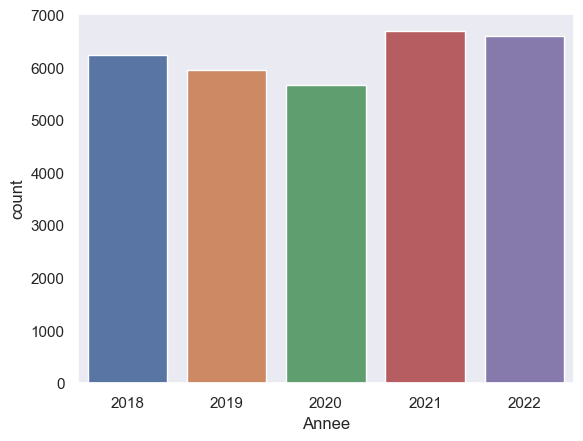

In [18]:
sns.countplot(x='Annee', data=df_bdx)

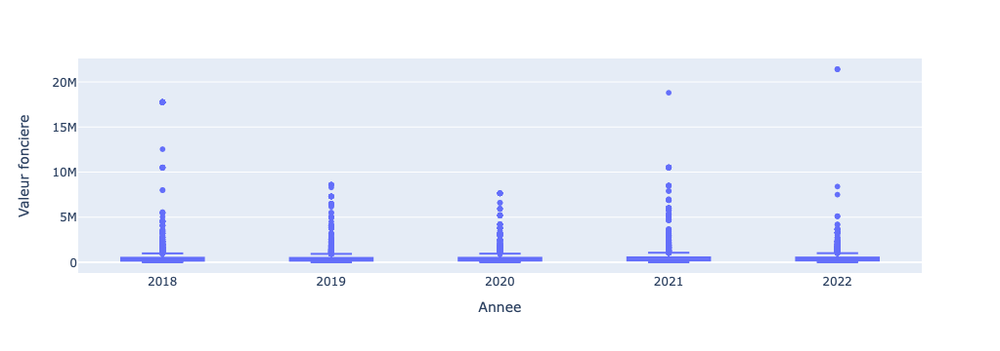

In [19]:
fig = px.box(df_bdx, x='Annee', y='Valeur fonciere', hover_data=['No voie', 'Voie', 'Code postal'])
fig.show()

Nettoyons le jeu de données en supprimant tous les biens dont la valeur foncière est > 1M

In [20]:
df_bdx = df_bdx[df_bdx['Valeur fonciere']<1000000]

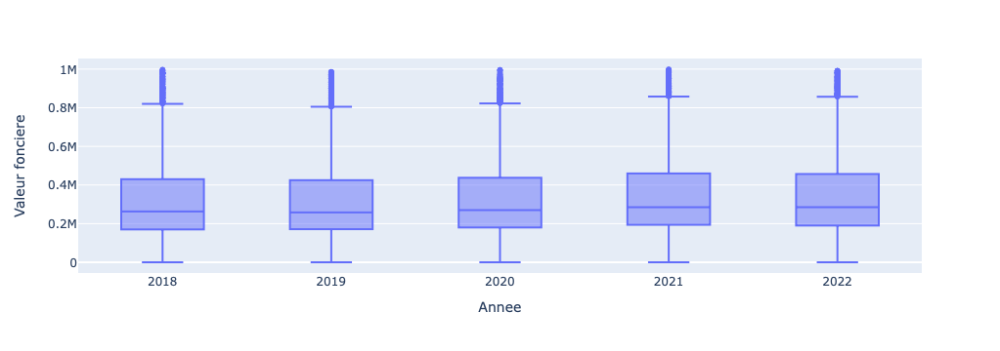

In [21]:
fig = px.box(df_bdx, x='Annee', y='Valeur fonciere', hover_data=['No voie', 'Voie', 'Code postal'])
fig.show()

In [22]:
df_bdx.describe()

,No disposition,Date mutation,Valeur fonciere,No voie,Code commune,Code type local,Surface reelle bati,Nombre pieces principales,Annee
count,28856.000000,28856,28856.000000,28731.000000,28856.0,28856.000000,28854.000000,28854.000000,28856.000000
mean,1.017466,2020-07-22 11:51:39.972275968,335788.826434,77.638857,63.0,1.778867,65.481250,2.776184,2020.041482
min,1.000000,2018-01-02 00:00:00,1.000000,1.000000,63.0,1.000000,4.000000,0.000000,2018.000000
25%,1.000000,2019-04-11 00:00:00,180500.000000,14.000000,63.0,2.000000,39.000000,2.000000,2019.000000
50%,1.000000,2020-08-31 00:00:00,273425.000000,33.000000,63.0,2.000000,60.000000,3.000000,2020.000000
75%,1.000000,2021-10-25 00:00:00,441425.000000,75.000000,63.0,2.000000,82.000000,4.000000,2021.000000
max,16.000000,2022-12-30 00:00:00,999350.000000,9109.000000,63.0,2.000000,400.000000,30.000000,2022.000000
std,0.338138,NaN,207646.787850,421.310862,0.0,0.415017,37.265616,1.399167,1.432491


Cherchons la voie la plus vendue

In [23]:
df_bdx['Voie'].value_counts()

Voie
SAINT LOUIS         332
PASTEUR             300
THIERS              245
DE L YSER           233
DE LA SOMME         226
                   ... 
ARTIGUEMALE           1
DU DOYEN SIGALAS      1
COMAYROU              1
DE BEIRA              1
GUESTIER              1
Name: count, Length: 1582, dtype: int64

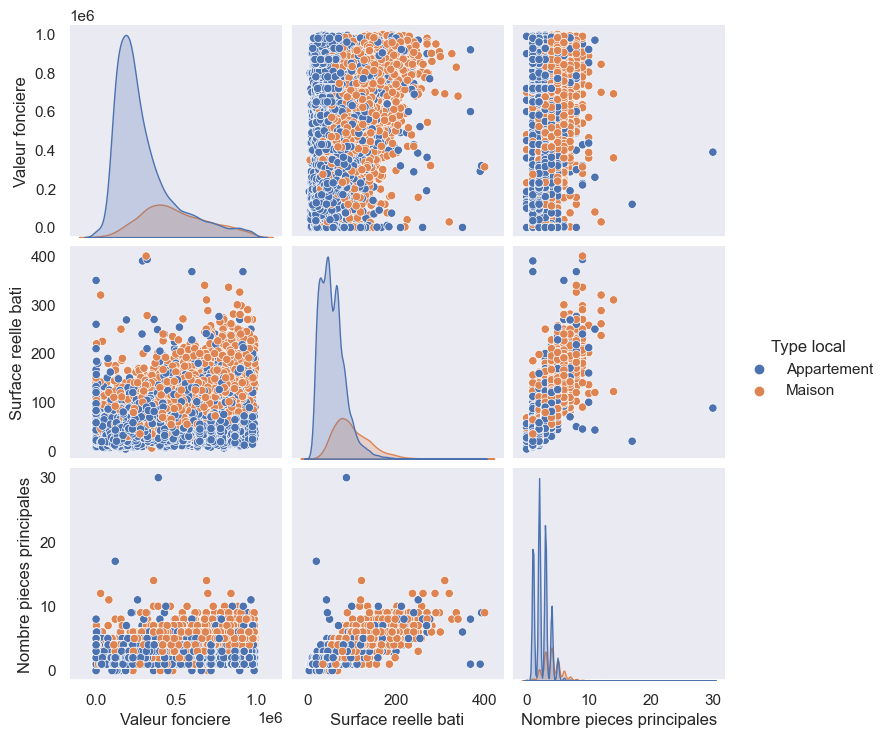

In [24]:
sns.pairplot(df_bdx[['Valeur fonciere', 'Surface reelle bati', 'Nombre pieces principales', 'Type local']], hue='Type local')

Supprimons les biens ayant plus de 15 pièces principales

In [25]:
df_bdx = df_bdx[df_bdx['Nombre pieces principales']<15]

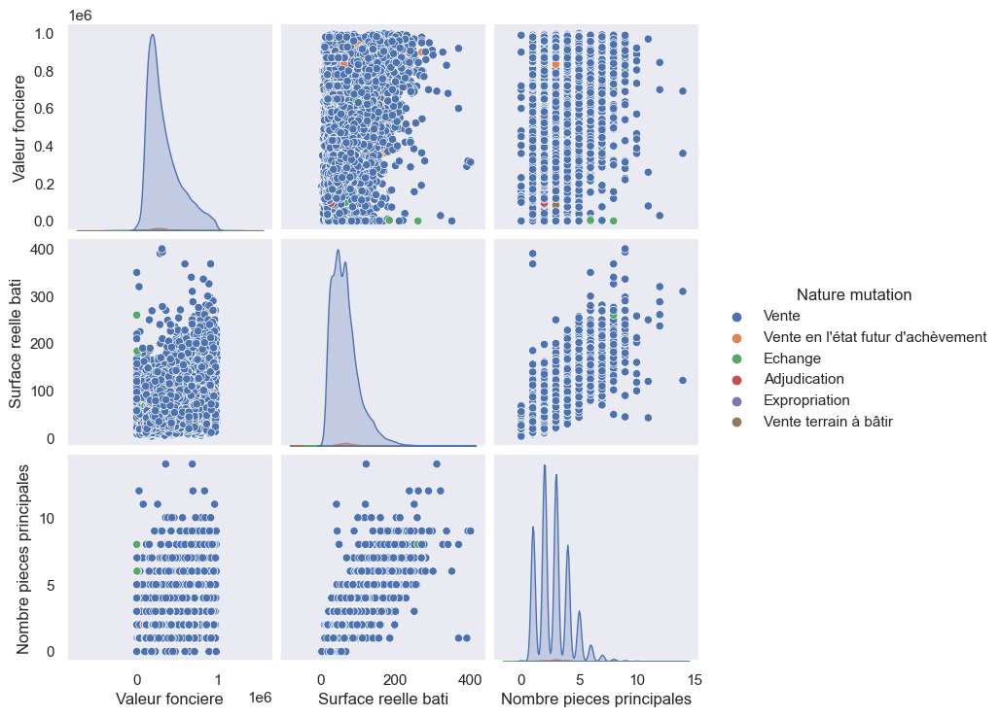

In [26]:
sns.pairplot(df_bdx[['Valeur fonciere', 'Surface reelle bati', 'Nombre pieces principales', 'Nature mutation']], hue='Nature mutation')

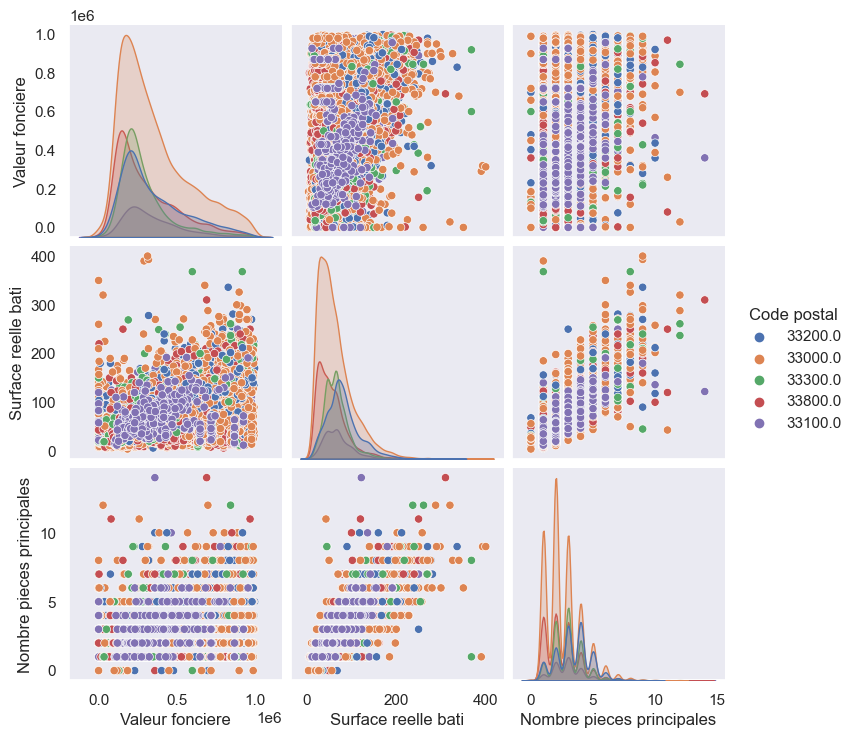

In [27]:
sns.pairplot(df_bdx[['Valeur fonciere', 'Surface reelle bati', 'Nombre pieces principales', 'Code postal']], hue='Code postal')

/opt/miniconda3/envs/reg-prix-maisons/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



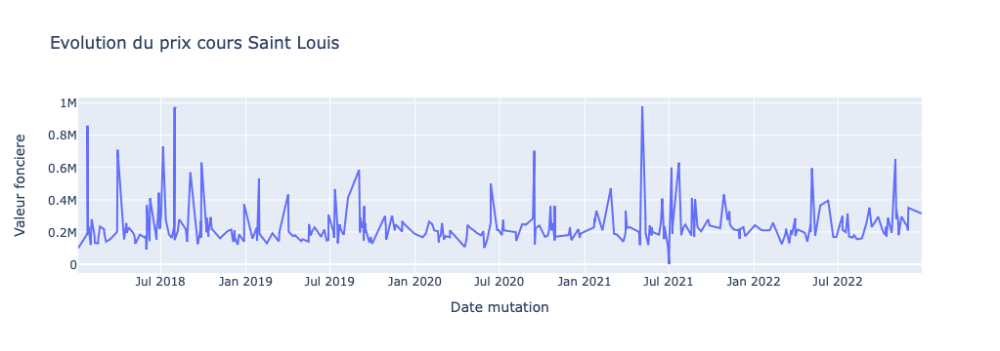

In [28]:
fig = px.line(df_bdx[df_bdx['Voie']=='SAINT LOUIS'].sort_values('Date mutation'), x='Date mutation', y='Valeur fonciere', title='Evolution du prix cours Saint Louis')
fig.show()

Regardons l'évolution du prix au m2

In [29]:
df_bdx['Valeur au m2'] = df_bdx['Valeur fonciere']/df_bdx['Surface reelle bati']

/opt/miniconda3/envs/reg-prix-maisons/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



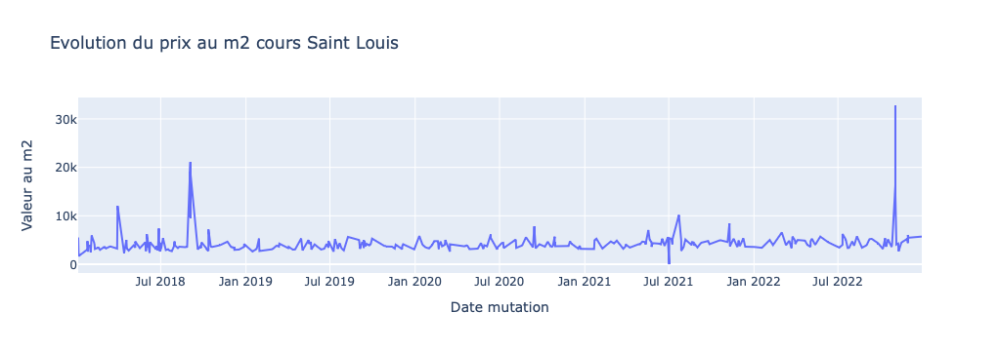

In [30]:
fig = px.line(df_bdx[df_bdx['Voie']=='SAINT LOUIS'].sort_values('Date mutation'), x='Date mutation', y='Valeur au m2', 
              title='Evolution du prix au m2 cours Saint Louis')
fig.show()

## Préparation des données pour les modèles de machine learning

In [31]:
df_ML = df_bdx.copy()
df_ML.head(200)

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Annee,Valeur au m2
0,1,2018-01-09,Vente,202000.0,28.0,RUE,4644,J JACQUES ROUSSEAU CAUD,33200.0,BORDEAUX,33,63,2.0,Appartement,81.0,4.0,2018,2493.827160
1,1,2018-01-10,Vente,390000.0,16.0,RUE,2515,DELACROIX,33200.0,BORDEAUX,33,63,1.0,Maison,138.0,6.0,2018,2826.086957
2,1,2018-01-09,Vente,825000.0,23.0,IMP,5732,LUCKNER,33000.0,BORDEAUX,33,63,2.0,Appartement,112.0,2.0,2018,7366.071429
3,1,2018-01-09,Vente,214000.0,107.0,RUE,2400,CROIX SEGUEY,33000.0,BORDEAUX,33,63,2.0,Appartement,45.0,2.0,2018,4755.555556
4,1,2018-01-11,Vente,295000.0,131.0,CRS,6265,DU MEDOC,33300.0,BORDEAUX,33,63,2.0,Appartement,71.0,3.0,2018,4154.929577
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,1,2018-01-26,Vente,164000.0,118.0,RUE,5785,MAC CARTHY CAUD,33200.0,BORDEAUX,33,63,2.0,Appartement,74.0,4.0,2018,2216.216216
206,1,2018-01-19,Vente,295125.0,6.0,CRS,6115,DE LA MARTINIQUE,33000.0,BORDEAUX,33,63,2.0,Appartement,96.0,4.0,2018,3074.218750
207,1,2018-02-01,Vente,112700.0,328.0,RUE,6975,PASTEUR,33200.0,BORDEAUX,33,63,2.0,Appartement,22.0,1.0,2018,5122.727273
208,1,2018-01-26,Vente,112000.0,24.0,RUE,1580,DE CARDOZE,33200.0,BORDEAUX,33,63,2.0,Appartement,38.0,2.0,2018,2947.368421


In [32]:
df_ML.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28852 entries, 0 to 31128
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   No disposition             28852 non-null  int64         
 1   Date mutation              28852 non-null  datetime64[ns]
 2   Nature mutation            28852 non-null  object        
 3   Valeur fonciere            28852 non-null  float64       
 4   No voie                    28727 non-null  float64       
 5   Type de voie               28845 non-null  object        
 6   Code voie                  28852 non-null  object        
 7   Voie                       28852 non-null  object        
 8   Code postal                28852 non-null  object        
 9   Commune                    28852 non-null  object        
 10  Code departement           28852 non-null  object        
 11  Code commune               28852 non-null  int64         
 12  Code type

In [33]:
df_ML = df_ML.drop(columns=['No disposition', 'Date mutation', 'No voie', 'Type de voie', 
                            'Code voie', 'Voie', 'Commune', 'Code departement', 
                            'Code commune', 'Code type local', 'Valeur au m2'])

In [34]:
df_ML.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28852 entries, 0 to 31128
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Nature mutation            28852 non-null  object 
 1   Valeur fonciere            28852 non-null  float64
 2   Code postal                28852 non-null  object 
 3   Type local                 28852 non-null  object 
 4   Surface reelle bati        28852 non-null  float64
 5   Nombre pieces principales  28852 non-null  float64
 6   Annee                      28852 non-null  int32  
dtypes: float64(3), int32(1), object(3)
memory usage: 1.7+ MB


In [35]:
df_ML = df_ML[df_ML['Nature mutation']=='Vente']

In [36]:
df_ML.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28497 entries, 0 to 31128
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Nature mutation            28497 non-null  object 
 1   Valeur fonciere            28497 non-null  float64
 2   Code postal                28497 non-null  object 
 3   Type local                 28497 non-null  object 
 4   Surface reelle bati        28497 non-null  float64
 5   Nombre pieces principales  28497 non-null  float64
 6   Annee                      28497 non-null  int32  
dtypes: float64(3), int32(1), object(3)
memory usage: 1.6+ MB


In [37]:
df_ML = df_ML.drop(columns=['Nature mutation'])

In [38]:
df_ML.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28497 entries, 0 to 31128
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Valeur fonciere            28497 non-null  float64
 1   Code postal                28497 non-null  object 
 2   Type local                 28497 non-null  object 
 3   Surface reelle bati        28497 non-null  float64
 4   Nombre pieces principales  28497 non-null  float64
 5   Annee                      28497 non-null  int32  
dtypes: float64(3), int32(1), object(2)
memory usage: 1.4+ MB


In [39]:
valeur = df_ML.pop('Valeur fonciere')  # Supprime la colonne Valeur fonciere
df_ML['Valeur fonciere'] = valeur         # Ajoute la colonne Valeur fonciere en dernière colonne

In [40]:
df_ML['Code postal'] = df_ML['Code postal'].astype(float)  # Convertir le code postal en float

In [41]:
# Remplace 'Maison' et 'Appartement' par 0 et 1
df_ML['Type local'] = df_ML['Type local'].replace({'Maison': 0, 'Appartement': 1})

In [42]:
df_ML.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28497 entries, 0 to 31128
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Code postal                28497 non-null  float64
 1   Type local                 28497 non-null  int64  
 2   Surface reelle bati        28497 non-null  float64
 3   Nombre pieces principales  28497 non-null  float64
 4   Annee                      28497 non-null  int32  
 5   Valeur fonciere            28497 non-null  float64
dtypes: float64(4), int32(1), int64(1)
memory usage: 1.4 MB


In [43]:
df_ML.columns

Index(['Code postal', 'Type local', 'Surface reelle bati',
       'Nombre pieces principales', 'Annee', 'Valeur fonciere'],
      dtype='object')

### Split et normalisation

In [44]:
# ---- Split => train, test
#
data       = df_ML.sample(frac=1., axis=0)
data_train = data.sample(frac=0.7, axis=0)
data_test  = data.drop(data_train.index)

# ---- Split => x,y (medv is price)
#
x_train = data_train.drop('Valeur fonciere',  axis=1)
y_train = data_train['Valeur fonciere']
x_test  = data_test.drop('Valeur fonciere',   axis=1)
y_test  = data_test['Valeur fonciere']

print('Original data shape was : ',data.shape)
print('x_train : ',x_train.shape, 'y_train : ',y_train.shape)
print('x_test  : ',x_test.shape,  'y_test  : ',y_test.shape)

Original data shape was :  (28497, 6)
x_train :  (19948, 5) y_train :  (19948,)
x_test  :  (8549, 5) y_test  :  (8549,)


**Note :** 
 - All input data must be normalized, train and test.  
 - To do this we will subtract the mean and divide by the standard deviation.  

In [45]:
display(x_train.describe().style.format("{0:.2f}").set_caption("Before normalization :"))

mean = x_train.mean()
std  = x_train.std()
x_train = (x_train - mean) / std
x_test  = (x_test  - mean) / std

display(x_train.describe().style.format("{0:.2f}").set_caption("After normalization :"))

x_train, y_train = np.array(x_train), np.array(y_train)
x_test,  y_test  = np.array(x_test),  np.array(y_test)

,Code postal,Type local,Surface reelle bati,Nombre pieces principales,Annee
count,19948.00,19948.00,19948.00,19948.00,19948.00
mean,33230.42,0.78,65.29,2.77,2020.05
std,291.68,0.42,37.07,1.39,1.43
min,33000.00,0.00,4.00,0.00,2018.00
25%,33000.00,1.00,39.00,2.00,2019.00
50%,33100.00,1.00,60.00,3.00,2020.00
75%,33300.00,1.00,82.00,4.00,2021.00
max,33800.00,1.00,368.00,14.00,2022.00


,Code postal,Type local,Surface reelle bati,Nombre pieces principales,Annee
count,19948.00,19948.00,19948.00,19948.00,19948.00
mean,0.00,0.00,-0.00,0.00,0.00
std,1.00,1.00,1.00,1.00,1.00
min,-0.79,-1.86,-1.65,-1.99,-1.43
25%,-0.79,0.54,-0.71,-0.56,-0.73
50%,-0.45,0.54,-0.14,0.16,-0.03
75%,0.24,0.54,0.45,0.88,0.66
max,1.95,0.54,8.17,8.07,1.36


## Modèle DNN avec Keras

### Construire un modèle
Plus d'informations sur : 
 - [Optimizer](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers)
 - [Activation](https://www.tensorflow.org/api_docs/python/tf/keras/activations)
 - [Loss](https://www.tensorflow.org/api_docs/python/tf/keras/losses)
 - [Metrics](https://www.tensorflow.org/api_docs/python/tf/keras/metrics)

In [46]:
def get_model_keras(shape):
  
  model = keras.models.Sequential()
  model.add(keras.layers.Input(shape, name="InputLayer"))
  model.add(keras.layers.Dense(64, activation='relu', name='Dense_n1'))
  model.add(keras.layers.Dense(64, activation='relu', name='Dense_n2'))
  model.add(keras.layers.Dense(1, name='Output'))

  model.compile(optimizer = tf.keras.optimizers.legacy.Adam(1e-2),
                loss      = 'mse',
                metrics   = ['mae', 'mse'] )
  return model

### Train the model
#### Get it

In [47]:
model=get_model_keras( (5,) )

model.summary()
img=keras.utils.plot_model( model, to_file='./run/model.png', show_shapes=True, show_layer_names=True, dpi=96)
display(img)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_n1 (Dense)            (None, 64)                384       
                                                                 
 Dense_n2 (Dense)            (None, 64)                4160      
                                                                 
 Output (Dense)              (None, 1)                 65        
                                                                 
Total params: 4609 (18.00 KB)
Trainable params: 4609 (18.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


None

#### Add callback

In [48]:
os.makedirs('./run/models',   mode=0o750, exist_ok=True)
save_dir = "./run/models/best_model_keras.h5"

savemodel_callback = tf.keras.callbacks.ModelCheckpoint(filepath=save_dir, verbose=0, save_best_only=True)

#### Train it

In [49]:
history = model.fit(x_train,
                    y_train,
                    epochs          = 15,
                    batch_size      = 50,
                    verbose         = 1,
                    validation_data = (x_test, y_test),
                    callbacks       = [savemodel_callback])

Epoch 1/15
399/399 [==============================] - 0s 678us/step - loss: 82889310208.0000 - mae: 214971.1719 - mse: 82889318400.0000 - val_loss: 29993654272.0000 - val_mae: 120862.2500 - val_mse: 29993656320.0000
Epoch 2/15
286/399 [====================>.........] - ETA: 0s - loss: 27807424512.0000 - mae: 116528.6406 - mse: 27807424512.0000

/opt/miniconda3/envs/reg-prix-maisons/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



399/399 [==============================] - 0s 516us/step - loss: 27333216256.0000 - mae: 115333.1484 - mse: 27333216256.0000 - val_loss: 26807521280.0000 - val_mae: 113593.0469 - val_mse: 26807521280.0000
Epoch 3/15
399/399 [==============================] - 0s 551us/step - loss: 25836462080.0000 - mae: 111568.2891 - mse: 25836462080.0000 - val_loss: 26183667712.0000 - val_mae: 112581.9844 - val_mse: 26183667712.0000
Epoch 4/15
399/399 [==============================] - 0s 465us/step - loss: 25515255808.0000 - mae: 110483.8516 - mse: 25515255808.0000 - val_loss: 26042355712.0000 - val_mae: 110260.5312 - val_mse: 26042359808.0000
Epoch 5/15
399/399 [==============================] - 0s 468us/step - loss: 25417490432.0000 - mae: 109907.7344 - mse: 25417490432.0000 - val_loss: 25997834240.0000 - val_mae: 110605.8750 - val_mse: 25997834240.0000
Epoch 6/15
399/399 [==============================] - 0s 450us/step - loss: 25411907584.0000 - mae: 109891.9766 - mse: 25411907584.0000 - val_loss:

### Évaluer
#### Évaluation du modèle
MAE = Erreur Absolue Moyenne (entre les étiquettes et les prédictions)  
Une MAE égale à 100000 représente une erreur moyenne de prédiction de 100000€.

In [50]:
score = model.evaluate(x_test, y_test, verbose=0)

print('x_test / loss      : {:5.4f}'.format(score[0]))
print('x_test / mae       : {:5.4f}'.format(score[1]))
print('x_test / mse       : {:5.4f}'.format(score[2]))

x_test / loss      : 25884213248.0000
x_test / mae       : 108153.8125
x_test / mse       : 25884213248.0000


#### Historique de l'entrainement
Quel a été le meilleur résultat de notre entrainement ?

In [51]:
print("min( val_mae ) : {:.4f}".format( min(history.history["val_mae"]) ) )

min( val_mae ) : 108153.8203


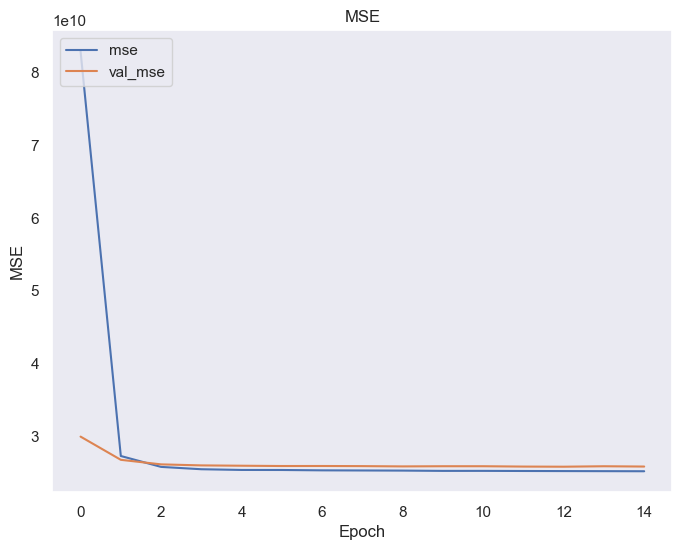

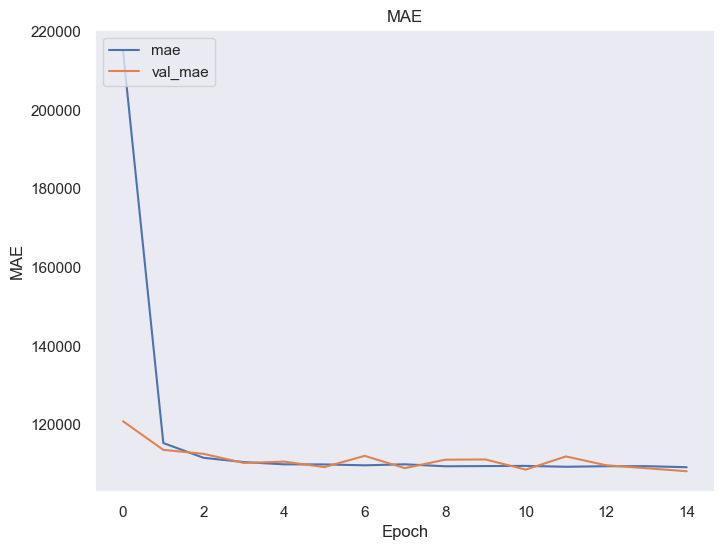

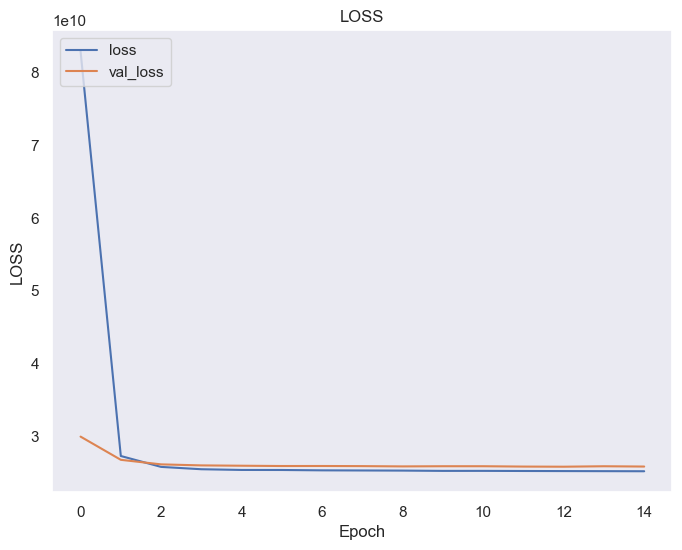

In [52]:
plot_history(history, 
             plot={'MSE' :['mse', 'val_mse'],
                   'MAE' :['mae', 'val_mae'],
                   'LOSS':['loss','val_loss']}, 
             save_as='./figs/history_keras')

### Restore a model :

#### Reload model

In [53]:
loaded_model = tf.keras.models.load_model('./run/models/best_model_keras.h5')
loaded_model.summary()
print("Loaded.")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_n1 (Dense)            (None, 64)                384       
                                                                 
 Dense_n2 (Dense)            (None, 64)                4160      
                                                                 
 Output (Dense)              (None, 1)                 65        
                                                                 
Total params: 4609 (18.00 KB)
Trainable params: 4609 (18.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Loaded.


#### Evaluate it :

In [54]:
score = loaded_model.evaluate(x_test, y_test, verbose=0)

print('x_test / loss      : {:5.4f}'.format(score[0]))
print('x_test / mae       : {:5.4f}'.format(score[1]))
print('x_test / mse       : {:5.4f}'.format(score[2]))

x_test / loss      : 25862227968.0000
x_test / mae       : 109676.7422
x_test / mse       : 25862227968.0000


#### Make a prediction

In [55]:
mes_donnees = [0.24513767,  0.53033004, -0.51777236, -0.55078921,  0.65960435]
prix_reel = 195000.0

mes_donnees=np.array(mes_donnees).reshape(1,5)

In [56]:
predictions = loaded_model.predict( mes_donnees )
print("Prédiction : {:.2f} €   Réalité : {:.2f} €".format(predictions[0][0], prix_reel))

1/1 [==============================] - 0s 35ms/step
Prédiction : 210518.56 €   Réalité : 195000.00 €


## Modèle DNN avec PyTorch

### Build a model
About informations about : 
 - [Optimizer](https://pytorch.org/docs/stable/optim.html)
 - [Basic neural-network blocks](https://pytorch.org/docs/stable/nn.html)
 - [Loss](https://pytorch.org/docs/stable/nn.html#loss-functions)

In [57]:
class model_pytorch(nn.Module):
    """
    Basic fully connected neural-network for tabular data
    """
    def __init__(self,num_vars):
        super(model_pytorch, self).__init__()
        self.num_vars=num_vars
        self.hidden1 = nn.Linear(self.num_vars, 64)
        self.hidden2 = nn.Linear(64, 64)
        self.hidden3 = nn.Linear(64, 1)

    def forward(self, x):
        x = x.view(-1,self.num_vars)   #flatten the observation before using fully-connected layers
        x = self.hidden1(x)
        x = F.relu(x)
        x = self.hidden2(x)
        x = F.relu(x)
        x = self.hidden3(x)
        return x

### Train the model

#### stochastic gradient descent strategy to fit the model

In [58]:
def fit(model,X_train,Y_train,X_test,Y_test, EPOCHS = 5, BATCH_SIZE = 32):
    
    loss = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(),lr=1e-2) #lr is the learning rate
    model.train()
    
    history=convergence_history_MSELoss()
    
    history.update(model,X_train,Y_train,X_test,Y_test)
    
    n=X_train.shape[0] #number of observations in the training data
    
    #stochastic gradient descent
    for epoch in range(EPOCHS):
        
        batch_start=0
        epoch_shuffler=np.arange(n) 
        np.random.shuffle(epoch_shuffler) #remark that 'utilsData.DataLoader' could be used instead
        
        while batch_start+BATCH_SIZE < n:
            #get mini-batch observation
            mini_batch_observations = epoch_shuffler[batch_start:batch_start+BATCH_SIZE]
            var_X_batch = Variable(X_train[mini_batch_observations,:]).float()
            var_Y_batch = Variable(Y_train[mini_batch_observations]).float()
            
            #gradient descent step
            optimizer.zero_grad()               #set the parameters gradients to 0
            Y_pred_batch = model(var_X_batch)   #predict y with the current NN parameters
            
            curr_loss = loss(Y_pred_batch.view(-1), var_Y_batch.view(-1))  #compute the current loss
            curr_loss.backward()                         #compute the loss gradient w.r.t. all NN parameters
            optimizer.step()                             #update the NN parameters
            
            #prepare the next mini-batch of the epoch
            batch_start+=BATCH_SIZE
            
        history.update(model,X_train,Y_train,X_test,Y_test)
    
    return history


#### get the model

In [59]:
model=model_pytorch( x_train[0,:].shape[0] )
print(model)

model_pytorch(
  (hidden1): Linear(in_features=5, out_features=64, bias=True)
  (hidden2): Linear(in_features=64, out_features=64, bias=True)
  (hidden3): Linear(in_features=64, out_features=1, bias=True)
)


#### train the model

In [60]:
torch_x_train=torch.from_numpy(x_train)
torch_y_train=torch.from_numpy(y_train)
torch_x_test=torch.from_numpy(x_test)
torch_y_test=torch.from_numpy(y_test)

batch_size  = 50
epochs      = 15


history=fit(model,torch_x_train,torch_y_train,torch_x_test,torch_y_test,EPOCHS=epochs,BATCH_SIZE = batch_size)

### Evaluate
#### Model evaluation

In [61]:
var_x_test = Variable(torch_x_test).float()
var_y_test = Variable(torch_y_test).float()
y_pred = model(var_x_test)

nn_loss = nn.MSELoss()
nn_MAE_loss = nn.L1Loss()

print('x_test / loss      : {:5.4f}'.format(nn_loss(y_pred.view(-1), var_y_test.view(-1)).item()))
print('x_test / mae       : {:5.4f}'.format(nn_MAE_loss(y_pred.view(-1), var_y_test.view(-1)).item()))


x_test / loss      : 26070173696.0000
x_test / mae       : 112060.7812


#### Training history
What was the best result during our training ?

In [62]:
df=pd.DataFrame(data=history.history)
df.describe()

,loss,mae,val_loss,val_mae
count,1.600000e+01,16.000000,1.600000e+01,16.000000
mean,3.389604e+10,124730.900391,3.463124e+10,125575.711914
std,3.312815e+10,56943.953522,3.285480e+10,56722.077604
min,2.384209e+10,105992.085938,2.588653e+10,108558.015625
25%,2.509790e+10,108380.031250,2.595866e+10,109709.384766
50%,2.547430e+10,110752.699219,2.604959e+10,111428.062500
75%,2.617849e+10,112674.333984,2.636105e+10,112557.875000
max,1.580178e+11,337966.781250,1.577686e+11,338089.125000


In [63]:
print("min( val_mae ) : {:.4f}".format( min(history.history["val_mae"]) ) )

min( val_mae ) : 108558.0156


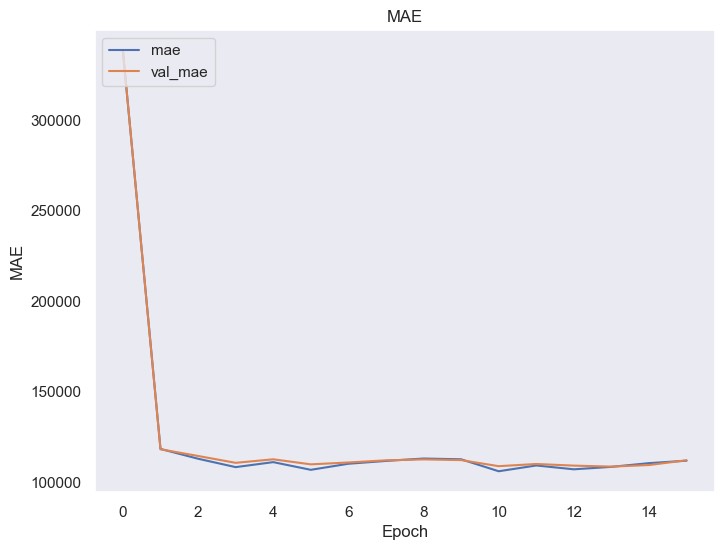

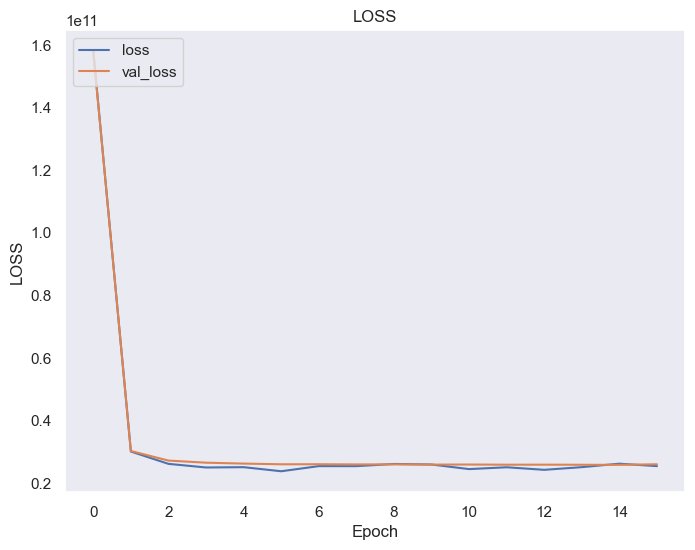

In [64]:
plot_history(history, plot={'MAE' :['mae', 'val_mae'],
                            'LOSS':['loss','val_loss']}, 
            save_as='./figs/history_pytorch')

### Make a prediction
The data must be normalized with the parameters (mean, std) previously used.

In [65]:
mes_donnees = [0.24513767,  0.53033004, -0.51777236, -0.55078921,  0.65960435]
prix_reel = 195000.0

mes_donnees=np.array(mes_donnees).reshape(1,5)

In [66]:
torch_my_data=torch.from_numpy(mes_donnees)
var_my_data = Variable(torch_my_data).float()

predictions = model( var_my_data )
print("Prédiction : {:.2f} €".format(predictions[0][0]))
print("Réalité    : {:.2f} €".format(prix_reel))

Prédiction : 211036.78 €
Réalité    : 195000.00 €


## Modèle Random Forest

In [67]:
# x = df_ML.drop(columns=['Valeur fonciere'])
# y = df_ML['Valeur fonciere']
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

### Entrainement

In [68]:
regr = RandomForestRegressor(max_depth=5)

In [69]:
regr.fit(x_train, y_train)

RandomForestRegressor(max_depth=5)

### Évaluation

In [70]:
print(regr.feature_importances_)

[0.03997679 0.02716163 0.92222709 0.00777013 0.00286436]


In [71]:
for name, feature in zip(['Code postal', 'Type local', 'Surface reelle bati',
       'Nombre pieces principales', 'Annee'], regr.feature_importances_):
    print(name, round(feature*100, 1))

Code postal 4.0
Type local 2.7
Surface reelle bati 92.2
Nombre pieces principales 0.8
Annee 0.3


In [72]:
y_pred = regr.predict(x_test)

In [73]:
mean_squared_error(y_test, y_pred)

24792561097.029472

In [74]:
mean_absolute_error(y_test, y_pred)

107625.50067227999

### Prédiction

In [75]:
mes_donnees = [0.24513767,  0.53033004, -0.51777236, -0.55078921,  0.65960435]
prix_reel = 195000.0

mes_donnees=np.array(mes_donnees).reshape(1,5)

In [76]:
predictions = regr.predict(mes_donnees)
print("Prédiction : {:.2f} €   Réalité : {:.2f} €".format(predictions[0], prix_reel))

Prédiction : 225583.03 €   Réalité : 195000.00 €
